In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import numpy as np
from scipy.stats import pearsonr

In [3]:
data = pd.read_csv('data/lob_cleaned.csv').drop('Unnamed: 0', axis=1)

In [3]:
data

,date,timestamp,ask,bid,askvol,bidvol,ask10,ask20,ask30,ask40,...,bid130,bid140,bid150,bid160,bid170,bid180,bid190,bid200,mid,change
0,2021-02-27 16:07:33.369,1614434853369,47400.01,47400.01,105.922589,8.212342,1.219452,1.738009,2.261343,0.315847,...,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.0,0.0,47400.010,NaN
1,2021-02-27 16:07:34.369,1614434854369,47400.01,47410.18,7.105951,7.209818,2.066333,0.732340,2.961463,0.139241,...,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.0,0.0,47405.095,1.072785e-04
2,2021-02-27 16:07:35.369,1614434855369,47399.84,47400.00,6.765404,21.977592,1.043097,1.878350,2.737661,0.063301,...,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.0,0.0,47399.920,-1.091655e-04
3,2021-02-27 16:07:36.369,1614434856369,47400.01,47400.00,23.191152,149.827174,0.449528,0.042198,1.525882,0.021971,...,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.0,0.0,47400.005,1.793252e-06
4,2021-02-27 16:07:37.369,1614434857369,47400.01,47402.38,189.998602,4.397697,0.468743,1.169567,0.004114,0.164783,...,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.0,0.0,47401.195,2.510548e-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170315,2021-03-01 15:27:20.157,1614605240157,48104.83,48107.36,10.261711,196.191527,0.438021,0.540848,0.500000,0.000000,...,1.365727,0.000000,0.000000,0.00,0.000000,0.0,0.0,0.0,48106.095,8.834717e-06
170316,2021-03-01 15:27:21.157,1614605241157,48104.83,48112.98,253.300547,204.274166,0.316580,1.205518,2.803350,2.968373,...,0.840576,4.663134,0.000000,0.00,0.000000,0.0,0.0,0.0,48108.905,5.841256e-05
170317,2021-03-01 15:27:22.157,1614605242157,48112.99,48112.99,274.752130,335.102035,0.248469,0.827158,0.551761,0.061456,...,0.015300,3.557690,0.000000,0.00,0.000000,0.0,0.0,0.0,48112.990,8.491151e-05
170318,2021-03-01 15:27:23.157,1614605243157,48113.00,48112.99,10.008420,171.132191,0.092687,0.062393,3.899253,0.186771,...,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.0,0.0,48112.995,1.039220e-07


/home/imetomi/.local/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


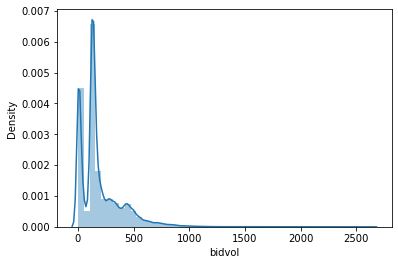

In [4]:
sns.distplot(data.bidvol)

In [5]:
data.change.mean()

9.934337457365649e-08

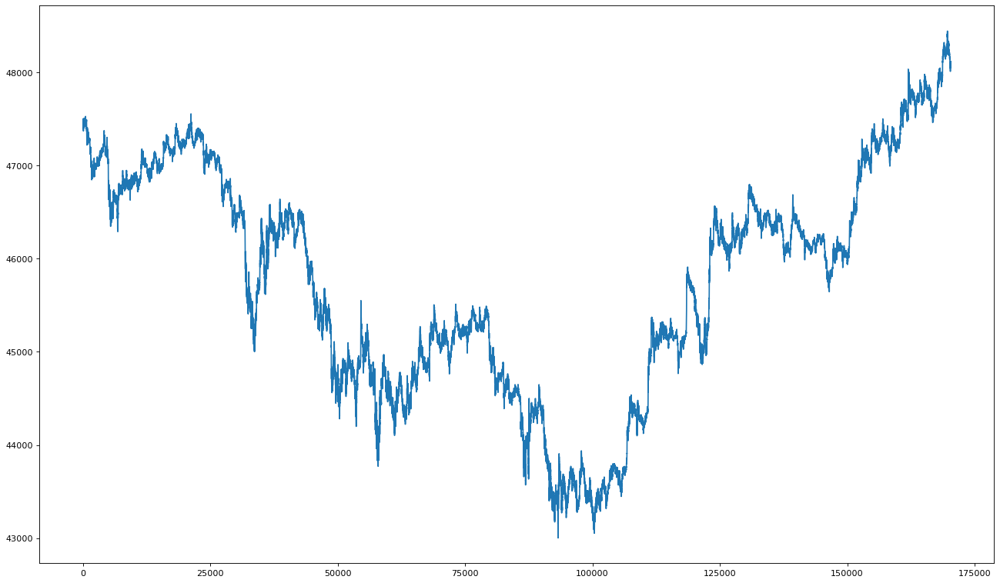

In [6]:
figure(figsize=(20, 12), dpi=80)
plt.plot(data.bid)
plt.show()



In [7]:
data['askvolch'] = np.sqrt(((data.askvol - data.askvol.mean()) ** 2) / data.askvol.std())
data['bidvolch'] = np.sqrt(((data.bidvol - data.bidvol.mean()) ** 2) / data.bidvol.std())
data['midch'] = np.sqrt(((data.mid - data.mid.mean()) ** 2) / data.mid.std())

In [8]:
idx = 1000
span = 20000
fig = make_subplots(rows=3, cols=1, subplot_titles=('Price', 'BID/ASK Volume', 'ASK/BID Volume'), shared_xaxes=True)

fig.add_trace(go.Scatter(x=data.date[idx:idx+span], y=data.mid[idx:idx+span], mode='lines',
            line=dict(color='blue', width=3)), row=1, col=1)

fig.add_trace(go.Scatter(x=data.date[idx:idx+span], y=data.bidvolch[idx:idx+span] / data.askvolch[idx:idx+span], mode='lines', marker=dict(
        size=6,
        colorscale=[[0, 'red'], [1, 'green']]
    ),line=dict(color='orange', width=3)), row=2, col=1)

fig.add_trace(go.Scatter(x=data.date[idx:idx+span], y=data.askvolch[idx:idx+span] / data.bidvolch[idx:idx+span], mode='lines', marker=dict(
        size=6,
        colorscale=[[0, 'red'], [1, 'green']]
    ),line=dict(color='green', width=3)), row=3, col=1)
                 
fig.update_xaxes(title_text="Price (USD)", row=1, col=1)
fig.update_yaxes(title_text="Timestamps", row=1, col=1)

fig.update_xaxes(title_text="Quantity", row=2, col=1)
fig.update_yaxes(title_text="Timestamps", row=2, col=1)

fig.update_xaxes(title_text="Quantity", row=3, col=1)
fig.update_yaxes(title_text="Timestamps", row=3, col=1)

fig.update_layout(height=900, width=950)
fig.show()

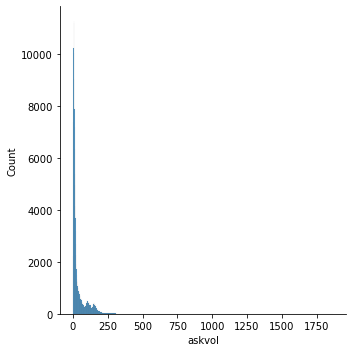

In [9]:
sns.displot(data.askvol)

In [10]:
data.bidvol.mean() / data.askvol.mean()

5.098614967764623

In [11]:
def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues


In [12]:
data[['askvolch', 'bidvolch', 'mid']].corr()

,askvolch,bidvolch,mid
askvolch,1.000000,0.017239,0.066221
bidvolch,0.017239,1.000000,-0.183997
mid,0.066221,-0.183997,1.000000


In [13]:
shift = 1
pearsonr(data.askvolch[shift+1:], data.change[1:].shift(shift)[shift:])

(-0.003975406503377456, 0.10087448056268335)

In [14]:
shift = 1
pearsonr(data.bidvolch[shift+1:], data.change[1:].shift(shift)[shift:])

(0.0011409806626903087, 0.6377300953633891)

### Conlusion 1
No correlation observed. P-values are really small.

### Conlusion 2
Anomalies may work. Labeling needed.

In [15]:
data

,date,timestamp,ask,bid,askvol,bidvol,ask10,ask20,ask30,ask40,...,bid160,bid170,bid180,bid190,bid200,mid,change,askvolch,bidvolch,midch
0,2021-02-27 16:07:33.369,1614434853369,47400.01,47400.01,105.922589,8.212342,1.219452,1.738009,2.261343,0.315847,...,0.00,0.000000,0.0,0.0,0.0,47400.010,NaN,9.166512,13.547144,46.785215
1,2021-02-27 16:07:34.369,1614434854369,47400.01,47410.18,7.105951,7.209818,2.066333,0.732340,2.961463,0.139241,...,0.00,0.000000,0.0,0.0,0.0,47405.095,1.072785e-04,4.198410,13.620049,46.930107
2,2021-02-27 16:07:35.369,1614434855369,47399.84,47400.00,6.765404,21.977592,1.043097,1.878350,2.737661,0.063301,...,0.00,0.000000,0.0,0.0,0.0,47399.920,-1.091655e-04,4.244468,12.546119,46.782650
3,2021-02-27 16:07:36.369,1614434856369,47400.01,47400.00,23.191152,149.827174,0.449528,0.042198,1.525882,0.021971,...,0.00,0.000000,0.0,0.0,0.0,47400.005,1.793252e-06,2.022891,3.248751,46.785072
4,2021-02-27 16:07:37.369,1614434857369,47400.01,47402.38,189.998602,4.397697,0.468743,1.169567,0.004114,0.164783,...,0.00,0.000000,0.0,0.0,0.0,47401.195,2.510548e-05,20.537769,13.824549,46.818980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170315,2021-03-01 15:27:20.157,1614605240157,48104.83,48107.36,10.261711,196.191527,0.438021,0.540848,0.500000,0.000000,...,0.00,0.000000,0.0,0.0,0.0,48106.095,8.834717e-06,3.771594,0.122918,66.904417
170316,2021-03-01 15:27:21.157,1614605241157,48104.83,48112.98,253.300547,204.274166,0.316580,1.205518,2.803350,2.968373,...,0.00,0.000000,0.0,0.0,0.0,48108.905,5.841256e-05,29.099339,0.710697,66.984485
170317,2021-03-01 15:27:22.157,1614605242157,48112.99,48112.99,274.752130,335.102035,0.248469,0.827158,0.551761,0.061456,...,0.00,0.000000,0.0,0.0,0.0,48112.990,8.491151e-05,32.000660,10.224650,67.100883
170318,2021-03-01 15:27:23.157,1614605243157,48113.00,48112.99,10.008420,171.132191,0.092687,0.062393,3.899253,0.186771,...,0.00,0.000000,0.0,0.0,0.0,48112.995,1.039220e-07,3.805851,1.699426,67.101026


In [16]:
pearsonr((data.askvolch / data.bidvolch)[2:], data.change[2:])

(-0.0024638485903145956, 0.3092416481953917)

No correlation in volume rates but there is a good chance it could work as an anomaly detection exercise.

In [17]:
data.describe()

,timestamp,ask,bid,askvol,bidvol,ask10,ask20,ask30,ask40,ask50,...,bid160,bid170,bid180,bid190,bid200,mid,change,askvolch,bidvolch,midch
count,1.703200e+05,170320.000000,170320.000000,170320.000000,170320.000000,170320.000000,170320.000000,170320.000000,170320.000000,170320.000000,...,170320.000000,170320.000000,170320.000000,170320.000000,170320.000000,170320.000000,1.703190e+05,170320.000000,170320.000000,170320.000000
mean,1.614520e+12,45755.160290,45760.998070,38.147862,194.501260,1.649861,1.315300,1.234859,1.016525,0.649913,...,0.315054,0.267324,0.218639,0.177854,0.144868,45758.079180,9.934337e-08,5.219699,10.012470,30.358213
std,4.918852e+07,1232.166943,1231.173073,54.667258,189.094347,3.471871,2.028814,2.005987,2.058421,1.682071,...,1.590258,1.474525,1.228217,1.185283,1.053475,1231.664591,1.528776e-04,5.236586,9.425721,17.607899
min,1.614435e+12,43000.010000,43004.800000,0.000000,0.011218,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,43002.485000,-2.525190e-03,0.000056,0.000113,0.000119
25%,1.614477e+12,44803.417500,44812.282500,6.655977,74.557661,0.134764,0.356453,0.202446,0.003374,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,44807.667500,-6.503806e-05,3.004323,4.178833,15.869235
50%,1.614520e+12,46023.785000,46029.620000,13.777585,137.645192,0.769150,0.852485,0.785997,0.464607,0.099609,...,0.000000,0.000000,0.000000,0.000000,0.000000,46026.302500,0.000000e+00,4.063825,6.097363,28.273052
75%,1.614563e+12,46782.577500,46785.385000,43.380154,260.650054,2.143067,1.721248,1.751040,1.460362,0.917394,...,0.000000,0.000000,0.000000,0.000000,0.000000,46784.021250,6.551652e-05,4.749136,13.621650,41.662833
max,1.614605e+12,48439.980000,48441.950000,1865.787806,2630.646596,134.897135,138.382347,166.934472,166.793277,165.817030,...,152.602088,164.778622,151.731743,155.873628,151.855850,48440.965000,5.610807e-03,247.187780,177.159286,78.517964


In [18]:
import trendet

import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='darkgrid')

In [63]:
data['cross_bidvol'] = (data.bidvol / data.askvol) > (data.bidvol / data.askvol).rolling(50).mean()
data.cross_bidvol.mean()

0.2762153593236261

In [64]:
data['cross_askvol'] = (data.askvol / data.bidvol) > (data.askvol / data.bidvol).rolling(50).mean()
data.cross_askvol.mean()

0.23766439643024895

In [66]:
data['trendline'] = data.mid.rolling(120).mean()

idx = 1000
span = 20000
fig = make_subplots(rows=3, cols=1, subplot_titles=('Price', 'BID/ASK Volume', 'ASK/BID Volume'), shared_xaxes=True)

fig.add_trace(go.Scatter(x=data.date[idx:idx+span], y=data.mid[idx:idx+span]), row=1, col=1)
fig.add_trace(go.Scatter(x=data.date[idx:idx+span], y=data.trendline[idx:idx+span]), row=1, col=1)

fig.add_trace(go.Scatter(x=data.date[idx:idx+span], y=data.cross_bidvol[idx:idx+span], mode='lines', marker=dict(
        size=6,
        colorscale=[[0, 'red'], [1, 'green']]
    ),line=dict(color='orange', width=3)), row=2, col=1)

fig.add_trace(go.Scatter(x=data.date[idx:idx+span], y=data.cross_askvol[idx:idx+span], mode='lines', marker=dict(
        size=6,
        colorscale=[[0, 'red'], [1, 'green']]
    ),line=dict(color='green', width=3)), row=3, col=1)
                 
fig.update_xaxes(title_text="Price (USD)", row=1, col=1)
fig.update_yaxes(title_text="Timestamps", row=1, col=1)

fig.update_xaxes(title_text="Quantity", row=2, col=1)
fig.update_yaxes(title_text="Timestamps", row=2, col=1)

fig.update_xaxes(title_text="Quantity", row=3, col=1)
fig.update_yaxes(title_text="Timestamps", row=3, col=1)

fig.update_layout(height=900, width=950)
fig.show()

In [125]:
import numpy as np
from scipy.signal import argrelextrema

def get_max_min(prices, smoothing, window_range):
    smooth_prices = prices['mid'].rolling(window=smoothing).mean().dropna()
    local_max = argrelextrema(smooth_prices.values, np.greater)[0]
    local_min = argrelextrema(smooth_prices.values, np.less)[0]
    price_local_max_dt = []
    for i in local_max:
        if (i>window_range) and (i<len(prices)-window_range):
            price_local_max_dt.append(prices.iloc[i-window_range:i+window_range]['mid'].idxmax())
    price_local_min_dt = []
    for i in local_min:
        if (i>window_range) and (i<len(prices)-window_range):
            price_local_min_dt.append(prices.iloc[i-window_range:i+window_range]['mid'].idxmin())  
    maxima = pd.DataFrame(prices.loc[price_local_max_dt])
    minima = pd.DataFrame(prices.loc[price_local_min_dt])
    #max_min = pd.concat([maxima, minima]).sort_index()
    maxima.index.name = 'ndate'
    maxima = maxima.reset_index()
    maxima = maxima[~maxima.ndate.duplicated()]
    p = prices.reset_index()   
    maxima['day_num'] = p[p.index.isin(maxima.ndate)].index.values
    maxima = maxima.set_index('day_num')['mid']

    minima.index.name = 'ndate'
    minima = minima.reset_index()
    minima = minima[~minima.ndate.duplicated()]
    p = prices.reset_index()   
    minima['day_num'] = p[p.index.isin(minima.ndate)].index.values
    minima = minima.set_index('day_num')['mid']
    
    return maxima, minima

smoothing = 10 * 60 
window = 20 * 60

maxima, minima = get_max_min(data, smoothing, window)
maxima, minima

(day_num
 515       47524.130
 866       47401.910
 916       47378.120
 1083      47354.995
 1310      47286.820
             ...    
 165182    47969.595
 165350    47945.850
 167828    47917.075
 169011    48306.920
 169666    48440.965
 Name: mid, Length: 212, dtype: float64,
 day_num
 1682      46844.690
 4977      46921.805
 4994      46651.350
 4996      46624.590
 5221      46552.645
             ...    
 167585    47649.800
 167646    47681.265
 167649    47681.265
 167684    47704.045
 167710    47720.305
 Name: mid, Length: 227, dtype: float64)

In [126]:
fig = make_subplots(rows=1, cols=1, subplot_titles=('Price'), shared_xaxes=True)

fig.add_trace(go.Scatter(x=data.index, y=data.mid, mode='lines', marker=dict(
        size=6, color='#b7c0fa')), row=1, col=1)

fig.add_trace(go.Scatter(x=maxima.index, y=maxima.values, mode='markers', marker=dict(
        size=12, color='#ff0050', opacity=0.7, symbol='triangle-down')), row=1, col=1)

fig.add_trace(go.Scatter(x=minima.index, y=minima.values, mode='markers', marker=dict(
        size=12, color='#83ccdb', opacity=0.7, symbol='triangle-up')), row=1, col=1)

fig.update_layout(height=900, width=1500)
fig.show()


In [127]:
data['position'] = np.zeros(len(data))
data['position'][minima.index] = 1
data['position'][maxima.index] = -1 

<ipython-input-127-d061e977d748>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-127-d061e977d748>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [131]:
data.to_csv('data/labeled.csv', index=False)

In [134]:
data[510:520]

,date,timestamp,ask,bid,askvol,bidvol,ask10,ask20,ask30,ask40,...,mid,change,askvolch,bidvolch,midch,days,trendline,cross_bidvol,cross_askvol,position
510,2021-02-27 16:16:03.391,1614435363391,47504.31,47518.68,134.818755,41.045600,0.000000,0.218069,1.348213,2.107447,...,47511.495,0.000189,13.074711,11.159472,49.961871,2021-02-27 16:16:03.391,47474.916458,False,True,0.0
511,2021-02-27 16:16:04.391,1614435364391,47518.21,47522.37,10.999236,20.721587,0.440997,1.586738,2.344316,1.122531,...,47520.290,0.000185,3.671844,12.637457,50.212476,2021-02-27 16:16:04.391,47475.398917,False,False,0.0
512,2021-02-27 16:16:05.391,1614435365391,47514.22,47522.43,54.970752,224.479682,1.972682,0.968748,1.477733,0.150000,...,47518.325,-0.000041,2.275291,2.180065,50.156485,2021-02-27 16:16:05.391,47475.862333,False,False,0.0
513,2021-02-27 16:16:06.391,1614435366391,47512.00,47517.06,3.580860,6.637174,1.716080,0.775017,0.649332,0.000000,...,47514.530,-0.000080,4.675177,13.661692,50.048350,2021-02-27 16:16:06.391,47476.293167,False,False,0.0
514,2021-02-27 16:16:07.391,1614435367391,47514.15,47526.30,162.672931,108.078834,0.000000,0.159281,1.635409,1.910720,...,47520.225,0.000120,16.841980,6.284738,50.210624,2021-02-27 16:16:07.391,47476.790958,False,False,0.0
515,2021-02-27 16:16:08.391,1614435368391,47521.96,47526.30,18.032745,13.062455,1.385096,2.572181,0.720790,1.176258,...,47524.130,0.000082,2.720564,13.194438,50.321893,2021-02-27 16:16:08.391,47477.361083,False,False,-1.0
516,2021-02-27 16:16:09.391,1614435369391,47512.03,47521.12,16.007350,13.476974,3.004913,3.135352,1.022329,2.191590,...,47516.575,-0.000159,2.994498,13.164294,50.106621,2021-02-27 16:16:09.391,47477.868250,False,False,0.0
517,2021-02-27 16:16:10.391,1614435370391,47512.03,47513.21,7.303272,22.877661,2.267784,1.243567,1.209162,1.200227,...,47512.620,-0.000083,4.171722,12.480665,49.993927,2021-02-27 16:16:10.391,47478.341875,False,False,0.0
518,2021-02-27 16:16:11.391,1614435371391,47505.80,47512.83,13.839617,9.667272,4.954042,0.997979,2.343314,4.334745,...,47509.315,-0.000070,3.287683,13.441340,49.899754,2021-02-27 16:16:11.391,47478.788542,False,False,0.0
519,2021-02-27 16:16:12.391,1614435372391,47496.40,47505.79,12.319371,93.059968,2.099125,2.721945,1.162424,3.366554,...,47501.095,-0.000173,3.493296,7.376927,49.665533,2021-02-27 16:16:12.391,47479.160750,False,False,0.0


In [1]:
data.info()

NameError: name 'data' is not defined